### Edges

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.color import rgb2gray, gray2rgb
from skimage.util import random_noise
from scipy.ndimage import uniform_filter, median_filter, gaussian_filter
# from scipy.signal import correlate2d
from scipy.ndimage import correlate, convolve, sobel
from scipy.io import loadmat
from skimage.feature import match_template, canny
from matplotlib.patches import Rectangle
# ONly if you have jupyter themes
from jupyterthemes import jtplot
jtplot.style()

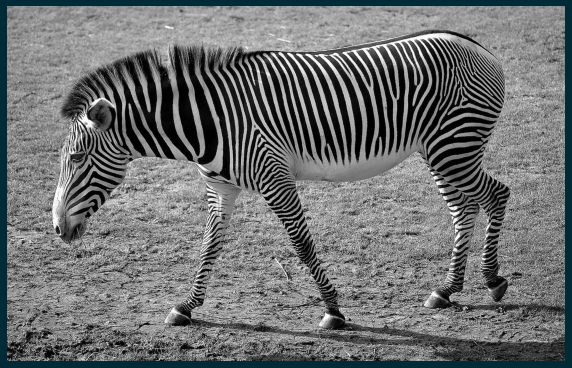

In [2]:
zebra = rgb2gray(imread('images/zebra2.jpg'))
f1, ax1 = plt.subplots(figsize=(10,10))
ax1.imshow(zebra, cmap=plt.cm.gray), ax1.axis('off')
plt.show()

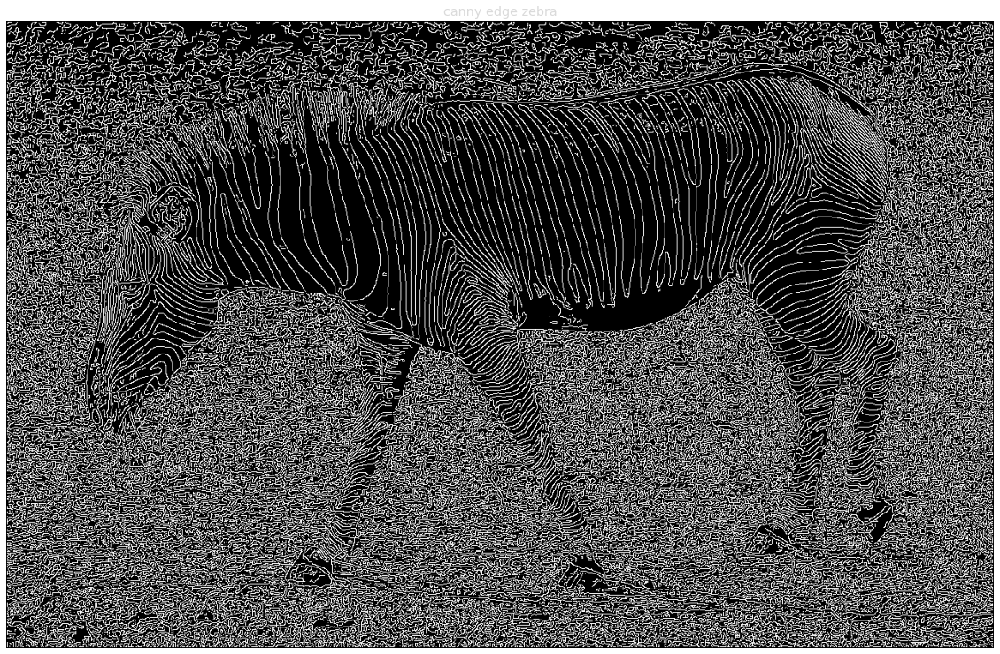

In [11]:
%matplotlib inline
edge_zebra = canny(zebra)
imshow_gray(edge_zebra, 'canny edge zebra')

#### Compute gradient

In [3]:
def imshow_gray(img, title, size=(20,20)):
    plt.figure(figsize=size)
    plt.imshow(img, cmap=plt.cm.gray), plt.axis('off'), plt.title(title)
    plt.show()

def manual_gradient(img):
    left_img = img.copy()
    right_img = img.copy()
    
    #first carry out the horizontal shift
    #shift image left
    left_img[:, :-1] = img[:, 1:]
    #shift image right
    right_img[:, 1:] = img[:, :-1]
    img_horizontal_diff = left_img - right_img
    imshow_gray(img_horizontal_diff,'Horizontal shift')
    
    #now carry out the vertical shift
    top_img = img.copy()
    bottom_img = img.copy()
    #shift image top
    top_img[:-1, :] = img[1:, :]
    #shift image bottom
    bottom_img[1:, :] = img[:-1, :]
    img_vertical_diff = top_img - bottom_img
    imshow_gray(img_vertical_diff,'Vertical shift')
    
    #now compute the gradient
    img_grad = np.sqrt(img_horizontal_diff**2 + img_vertical_diff**2)
    imshow_gray(img_grad,'Gradient')
    
    plt.show()

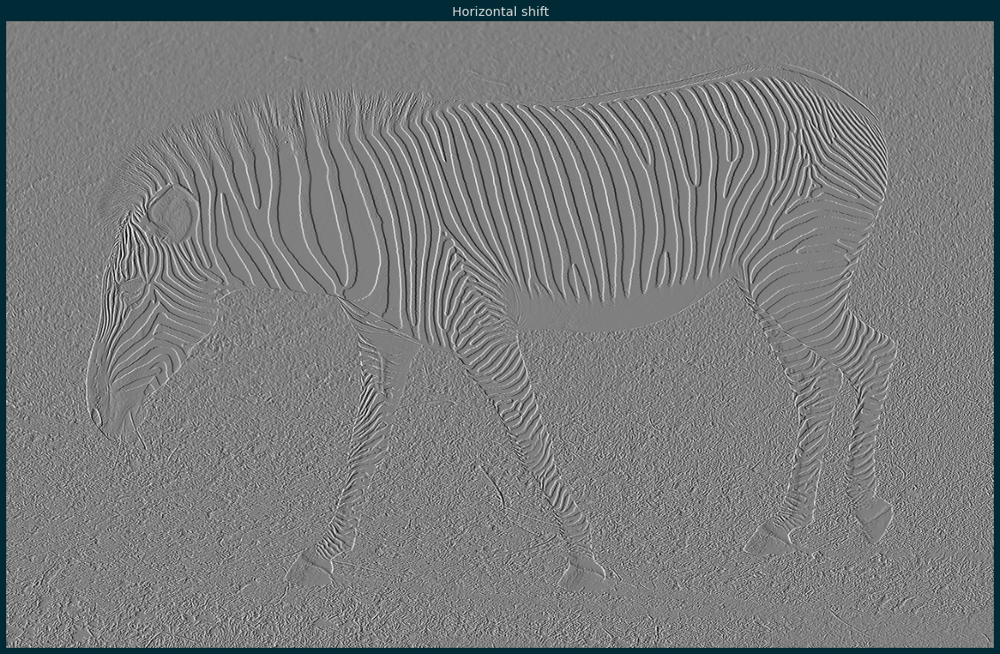

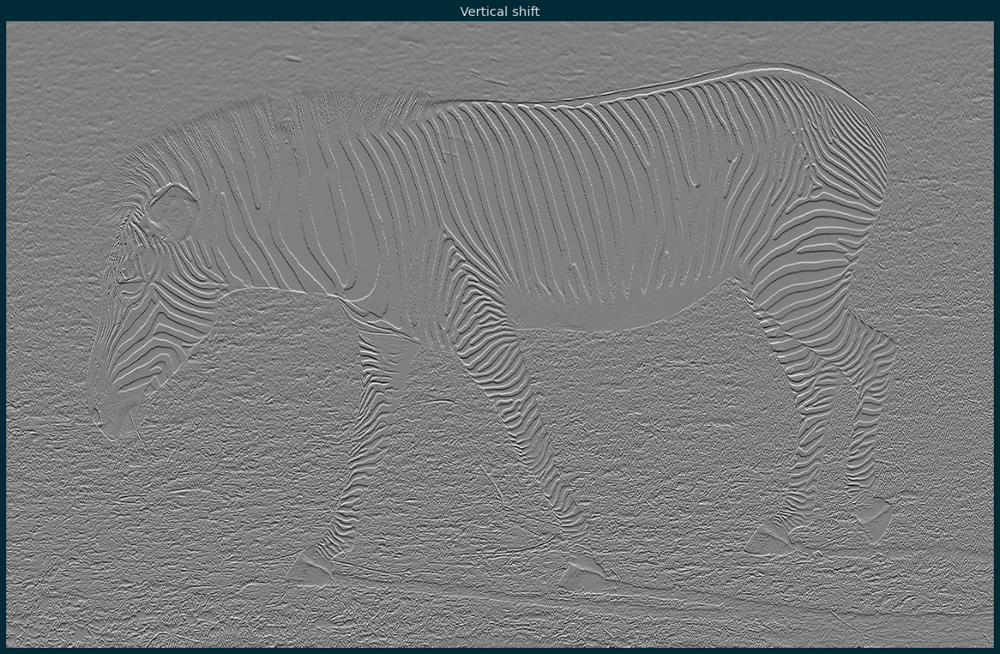

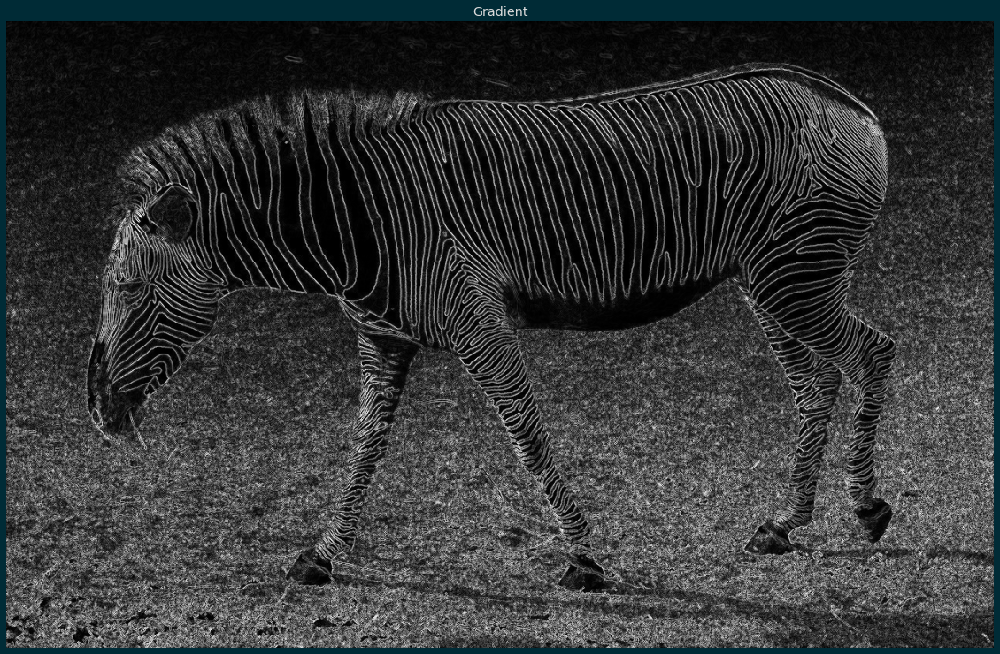

In [4]:
z1 = manual_gradient(zebra)

In [5]:
def sobel_edges(img):
    ver_sobel = 1/8*np.array([[-1, 0, 1],[-2, 0, 2],[-1, 0, 1]])
    hor_sobel = ver_sobel.T
    hor_edges = convolve(img, hor_sobel)
    imshow_gray(hor_edges, 'Horizontal edges')
    ver_edges = convolve(img, ver_sobel)
    imshow_gray(ver_edges, 'Vertical edgest')
    grad = np.sqrt(hor_edges**2 + ver_edges**2)
    imshow_gray(grad, 'Edges')
    

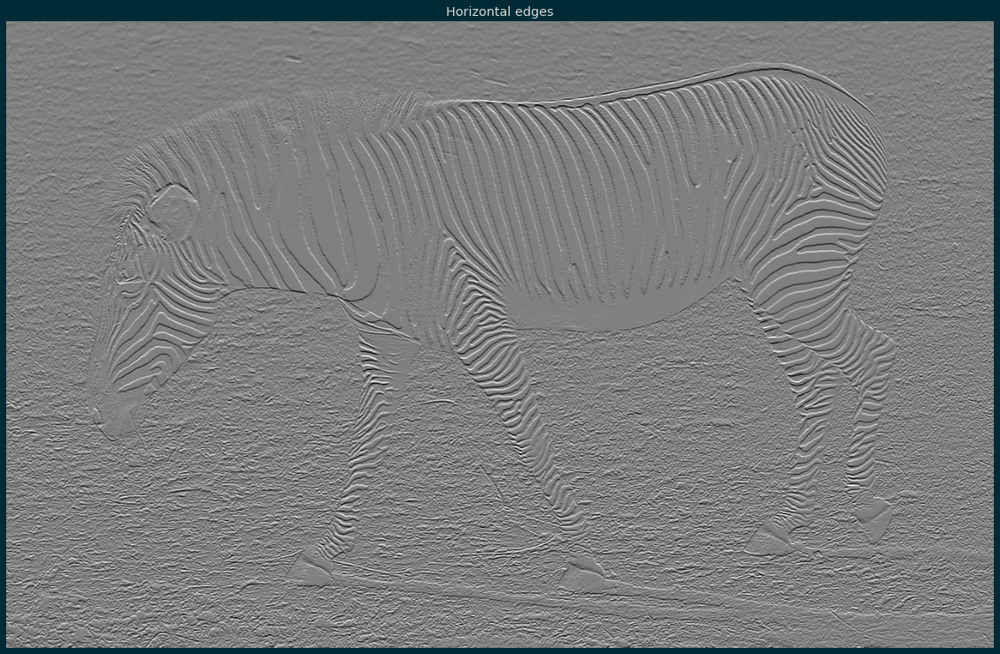

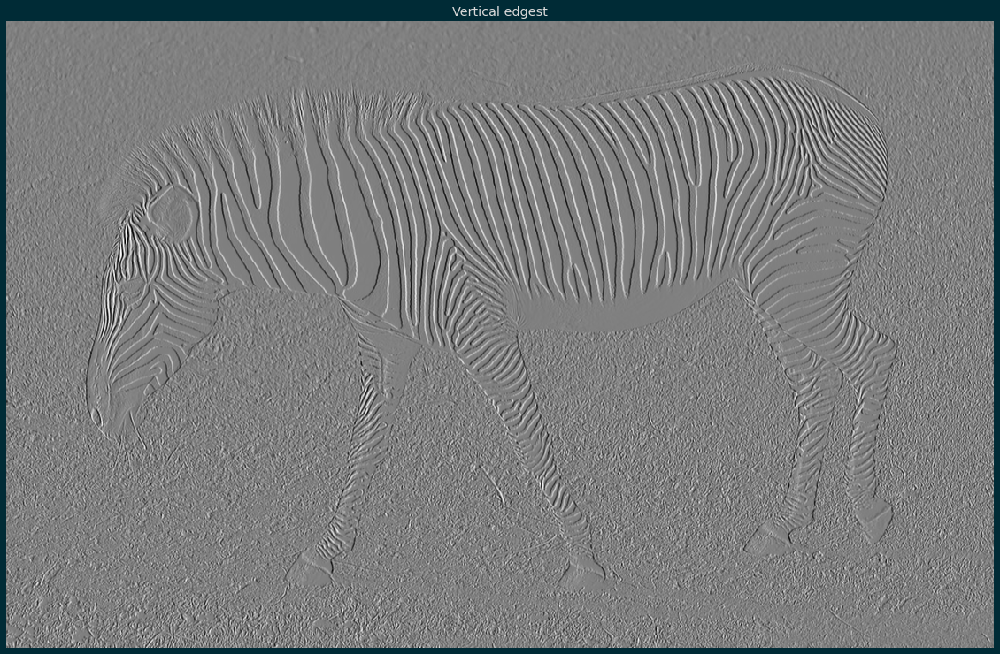

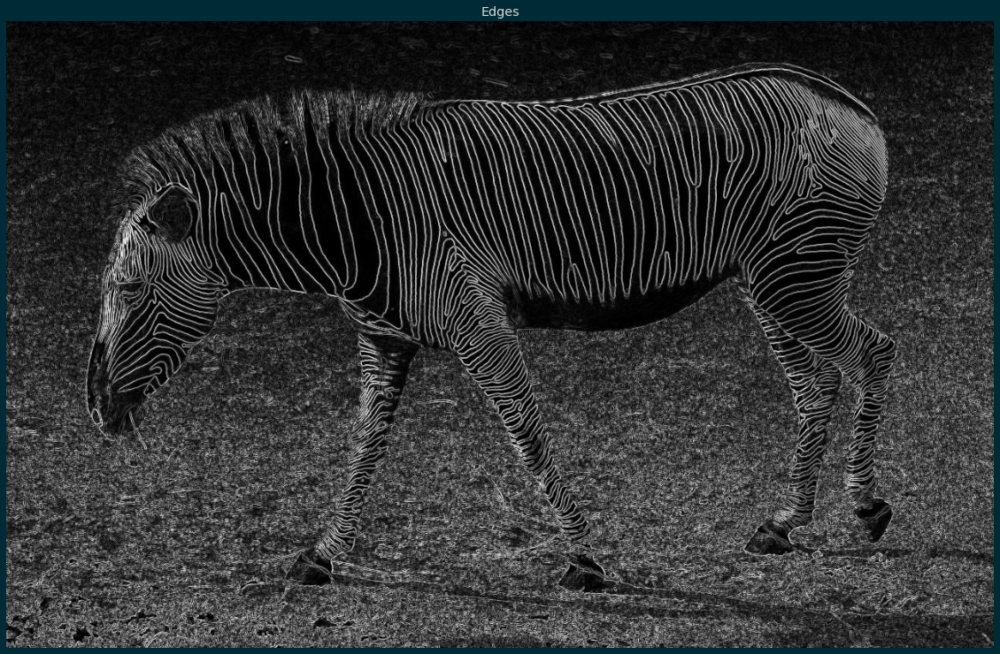

In [6]:
sobel_edges(zebra)

In [ ]:
# Also check sobel


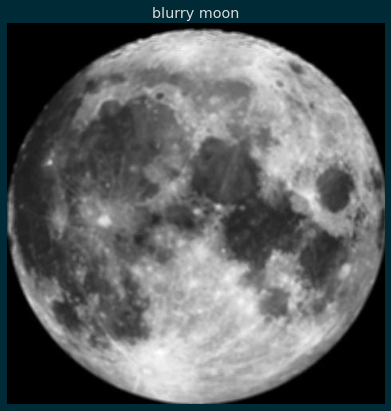

In [7]:
moona = rgb2gray(imread('images/moon_1.jpg'))
imshow_gray(moona, 'blurry moon', (7,7))

In [8]:
def normalise(img):
    img = img - img.min()
    return img/img.max()

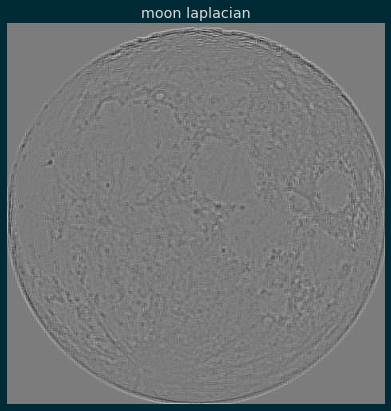

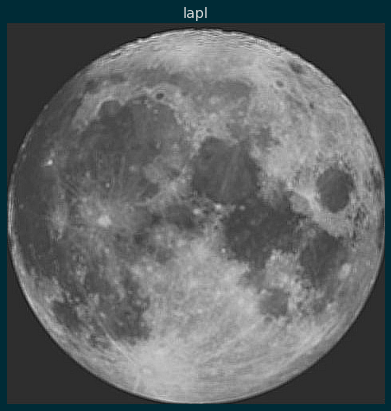

In [12]:
lapl1 = np.ones((3,3))
lapl1[1,1] = -8
ff2 = convolve(moona, lapl1)
imshow_gray(ff2, 'moon laplacian', (7,7))
ff2 = normalise(ff2)
ff3 = moona - 2*ff2
# ff5 = normalise(ff3)
imshow_gray(ff5,'lapl', (7,7))

In [71]:
def gaussian_filter2(size=(3,3), sigma=1):
    rows, cols = (size[0]-1)/2, (size[1]-1)/2
    [r, c] = np.mgrid[-rows:rows+1, -cols:cols+1]
    squares = r**2 + c**2
    f = np.exp(-squares/(2*sigma**2))
    #add extra axis for color filter, not needed for grayscale
#     return f[..., None]/f.sum()
    return f/f.sum()

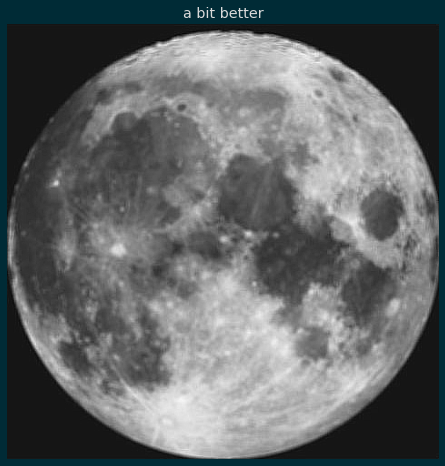

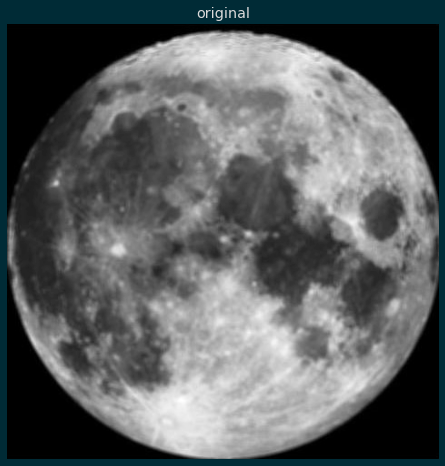

In [13]:
filt = 1/9* np.ones((3,3))
# filt = gaussian_filter2((5,5), sigma=0.5)

blurrier_moon = convolve(moona, filt)
# imshow_gray(blurrier_moon, 'blurrier moon', (8,8))
a_bit_better = 3*moona - 2* blurrier_moon
imshow_gray(a_bit_better, 'a bit better', (8,8))
imshow_gray(moona, 'original', (8,8))